In [10]:
import pandas as pd
import matplotlib.pyplot as plt

# CSVの読み込み

In [6]:
# CSVの読み込み
df_time_series_1 = pd.read_csv("../時系列データの可視化にBokehのススメ/time_series_data_1.csv", parse_dates=['date'], index_col='date')
df_time_series_2 = pd.read_csv("../時系列データの可視化にBokehのススメ/time_series_data_2.csv", parse_dates=['date'], index_col='date')

In [45]:
print(df_time_series_1.info())
print()
print(df_time_series_2.info())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 260832 entries, 1990-01-01 01:00:00 to 2020-01-02 00:00:00
Data columns (total 1 columns):
water_lev    260153 non-null float64
dtypes: float64(1)
memory usage: 4.0 MB
None

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 260832 entries, 1990-01-01 01:00:00 to 2020-01-02 00:00:00
Data columns (total 1 columns):
water_lev    258881 non-null float64
dtypes: float64(1)
memory usage: 4.0 MB
None


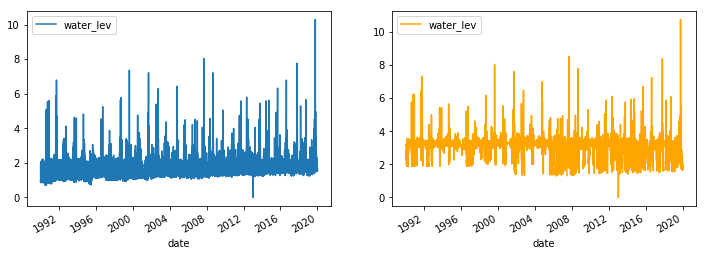

In [16]:
# matplotlibによる可視化
fig, ax_list = plt.subplots(1, 2, figsize=(12, 4))
df_time_series_1.plot(ax=ax_list[0])
df_time_series_2.plot(ax=ax_list[1], color='orange')

# Bokehによる可視化

In [17]:
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.models import ColumnDataSource
from bokeh.layouts import column

## 1つのグラフの可視化

In [28]:
# DataFrameから可視化用のインスタンスを生成する
source = ColumnDataSource(df_time_series_1)

In [29]:
# Bokehを描画するためのfigureインスタンスの生成。X軸の型にdatetimeを指定する。
bokeh_figure = figure(x_axis_type="datetime", plot_width=800, plot_height=400)

In [30]:
# figureインスタンスに描画するデータを指定する
bokeh_figure.line(x="date", y="water_lev", source=source, color="black", legend="time_seres_1")

GlyphRenderer(id='1642', ...)

In [46]:
# BokehをJupyter notebookで使用するためのおまじない
output_notebook()
# グラフの表示
show(bokeh_figure)

Loading BokehJS ...

## 2つのグラフをX軸を共有して可視化

In [32]:
# DataFrameから可視化用のインスタンスを生成する
source_1 = ColumnDataSource(df_time_series_1)
source_2 = ColumnDataSource(df_time_series_2)

In [39]:
# Bokehを描画するためのfigureインスタンスの生成。X軸の型にdatetimeを指定する。
bokeh_figure_1 = figure(x_axis_type="datetime", plot_width=800, plot_height=200)
bokeh_figure_2 = figure(x_axis_type="datetime", plot_width=800, plot_height=200)

In [40]:
# figureインスタンスに描画するデータを指定する
bokeh_figure_1.line(x="date", y="water_lev", source=source_1, color="black", legend="time_seres_1")
bokeh_figure_2.line(x="date", y="water_lev", source=source_2, color="blue", legend="time_seres_2")

GlyphRenderer(id='2393', ...)

In [41]:
# bokeh_figure_1とbokeh_figure_2のx軸を共有
bokeh_figure_1.x_range = bokeh_figure_2.x_range

In [43]:
# BokehをJupyter notebookで使用するためのおまじない
output_notebook()
# bokeh_figure_1とbokeh_figure_2を縦方向に並べる
col = column([bokeh_figure_1, bokeh_figure_2])
# グラフの表示
show(col)